Import Necessary Libraries

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 903.1/903.1 kB 24.3 MB/s eta 0:00:00


Checking if Ultralytics is loaded properly

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.7/112.6 GB disk)


Load the YOLOv8 Model

In [ ]:
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="yGjNOQYDYbnOqpzTKa2R")
project = rf.workspace("bees-xh9di").project("bees-detection-model")
version = project.version(3)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Bees-detection-model-3 in yolov8:: 100%|██████████| 4310/4310 [00:00<00:00, 4389.29it/s]


In [ ]:
!zip -r other-dataset.zip Bees-detection-model-3

  adding: Bees-detection-model-3/ (stored 0%)
  adding: Bees-detection-model-3/train/ (stored 0%)
  adding: Bees-detection-model-3/train/labels/ (stored 0%)
  adding: Bees-detection-model-3/train/labels/Beehive-3-15-2022-10_41_13am_mp4-11_jpg.rf.7170efed93c8cb3de7ba04ad2d29fcd7.txt (deflated 66%)
  adding: Bees-detection-model-3/train/labels/Beehive-3-14-2022-11_11_05am_mp4-32_jpg.rf.8df3f945df740d42045315e685b103a5.txt (deflated 65%)
  adding: Bees-detection-model-3/train/labels/Beehive-3-14-2022-11_11_05am_mp4-72_jpg.rf.e863769ba3df48e9719c620885e2a552.txt (deflated 68%)
  adding: Bees-detection-model-3/train/labels/HONEY-BEES-96fps-IN-4K-ULTRA-HD-_mp4-1_jpg.rf.74922f2edbcc13969894432a957c0b56.txt (deflated 13%)
  adding: Bees-detection-model-3/train/labels/frame12_jpg.rf.7aa23ab3754a5bd3c1953dd68af4a7ca.txt (deflated 55%)
  adding: Bees-detection-model-3/train/labels/Beehive-3-14-2022-11_11_05am_mp4-19_jpg.rf.c69c052b97138423aebd81efa1ecaa4e.txt (deflated 70%)
  adding: Bees-detecti

In [ ]:
!yolo task=detect mode=train data='/content/Bees-detection-model-3/data.yaml' model="/content/best.pt" epochs=300 imgsz=640

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/best.pt, data=/content/Bees-detection-model-3/data.yaml, epochs=300, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

In [ ]:
from ultralytics import YOLO

# Load your trained model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Validate the model on the validation dataset
results = model.val(data="/content/Bees-detection-model-3/data.yaml", conf=0.25)

# Extract metrics
# Access precision values using the 'p' attribute directly on 'results.box'
precision = results.box.p.mean()  # Average precision across classes
recall = results.box.r.mean()        # Average recall across classes
map50 = results.box.map50                 # mAP@0.5
map50_95 = results.box.map                # mAP@0.5:0.95


# Print metrics in percentage format
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall (Accuracy): {recall * 100:.2f}%")
print(f"mAP@0.5: {map50 * 100:.2f}%")
print(f"mAP@0.5:0.95: {map50_95 * 100:.2f}%")

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/Bees-detection-model-3/valid/labels.cache... 428 images, 0 backgrounds, 0 corrupt: 100%|██████████| 428/428 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 562, len(boxes) = 6717. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.89it/s]


                   all        428       6717      0.871      0.817      0.872      0.722
                   bee        405       6033      0.883      0.795      0.859      0.642
                 drone         47        101      0.942      0.969      0.976      0.884
             pollenbee        214        515      0.834      0.755      0.835      0.677
                 queen         66         68      0.825       0.75       0.82      0.687
Speed: 1.9ms preprocess, 9.7ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val
Precision: 87.08%
Recall (Accuracy): 81.72%
mAP@0.5: 87.24%
mAP@0.5:0.95: 72.24%


In [ ]:
!zip -r other-data-yolov8-v9-2.zip runs

  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/train/ (stored 0%)
  adding: runs/detect/train/train_batch27260.jpg (deflated 4%)
  adding: runs/detect/train/train_batch27262.jpg (deflated 4%)
  adding: runs/detect/train/args.yaml (deflated 53%)
  adding: runs/detect/train/val_batch1_pred.jpg (deflated 6%)
  adding: runs/detect/train/labels_correlogram.jpg (deflated 32%)
  adding: runs/detect/train/PR_curve.png (deflated 12%)
  adding: runs/detect/train/results.csv (deflated 64%)
  adding: runs/detect/train/R_curve.png (deflated 10%)
  adding: runs/detect/train/train_batch27261.jpg (deflated 4%)
  adding: runs/detect/train/train_batch1.jpg (deflated 1%)
  adding: runs/detect/train/labels.jpg (deflated 28%)
  adding: runs/detect/train/results.png (deflated 8%)
  adding: runs/detect/train/P_curve.png (deflated 11%)
  adding: runs/detect/train/weights/ (stored 0%)
  adding: runs/detect/train/weights/last.pt (deflated 8%)
  adding: runs/detect/train/wei

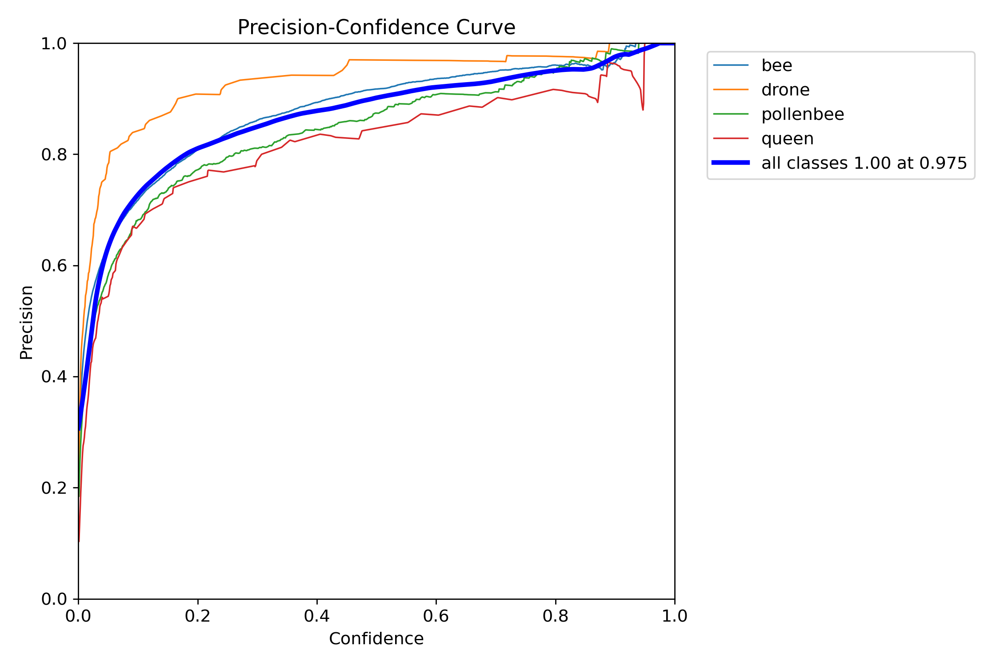

In [ ]:
Image("/content/runs/detect/train/P_curve.png", width=600)

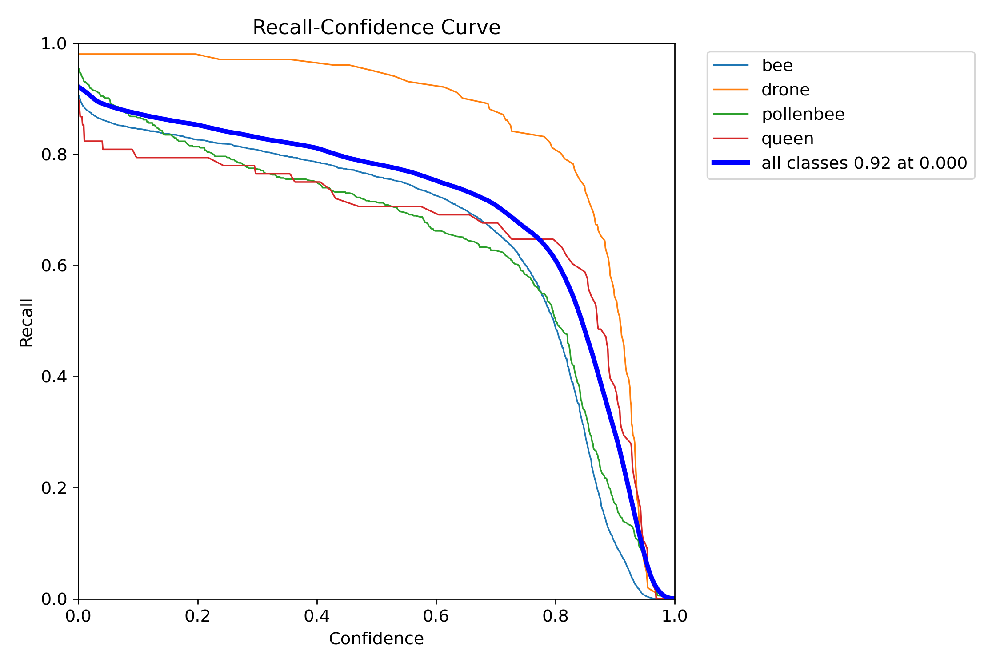

In [ ]:
Image("/content/runs/detect/train/R_curve.png", width=600)

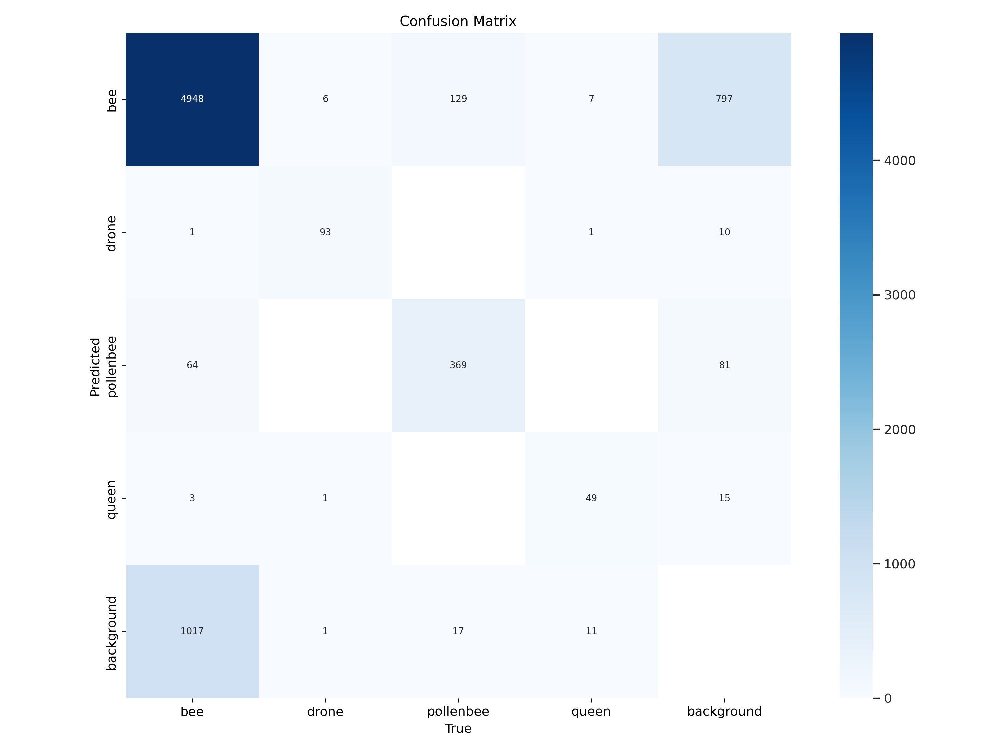

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

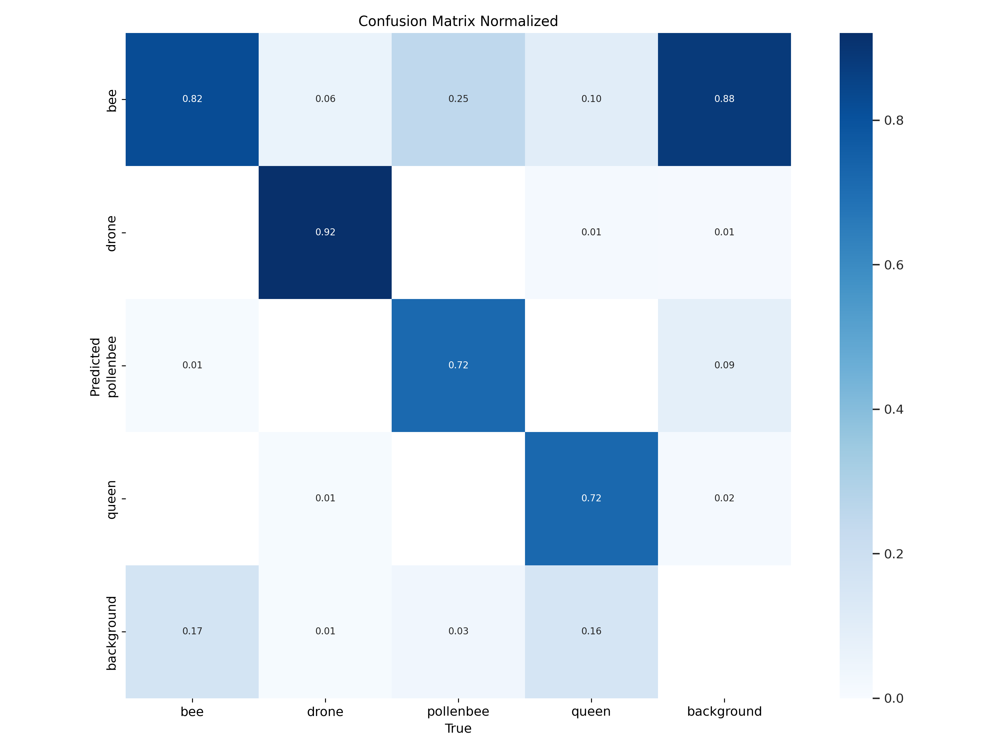

In [ ]:
Image("/content/runs/detect/train/confusion_matrix_normalized.png", width=600)

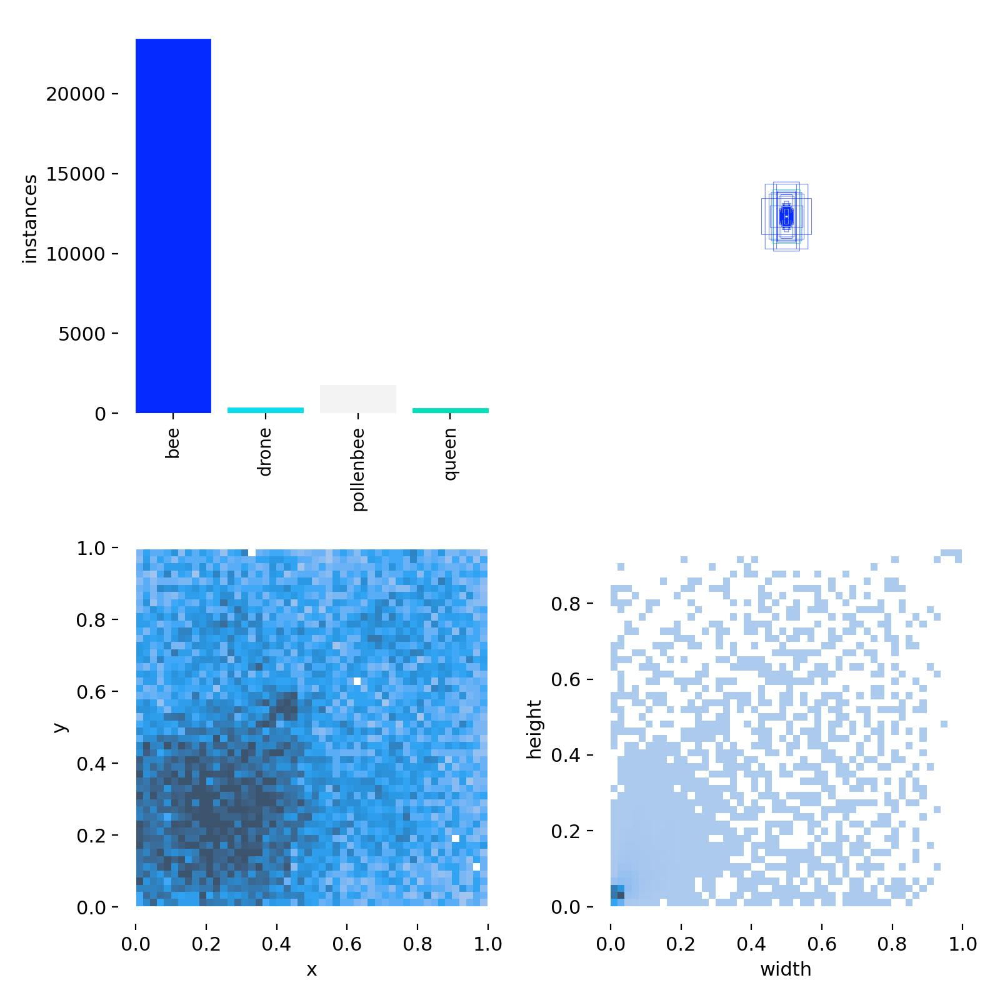

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

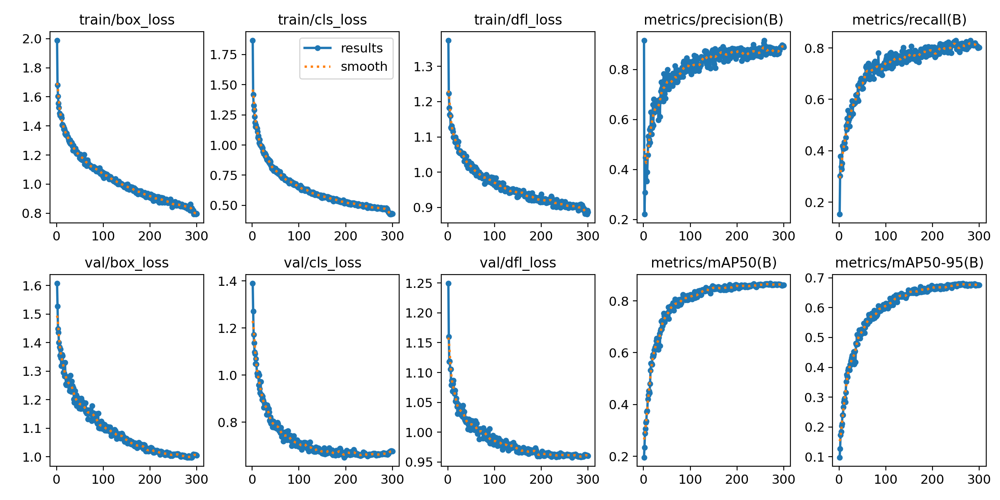

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

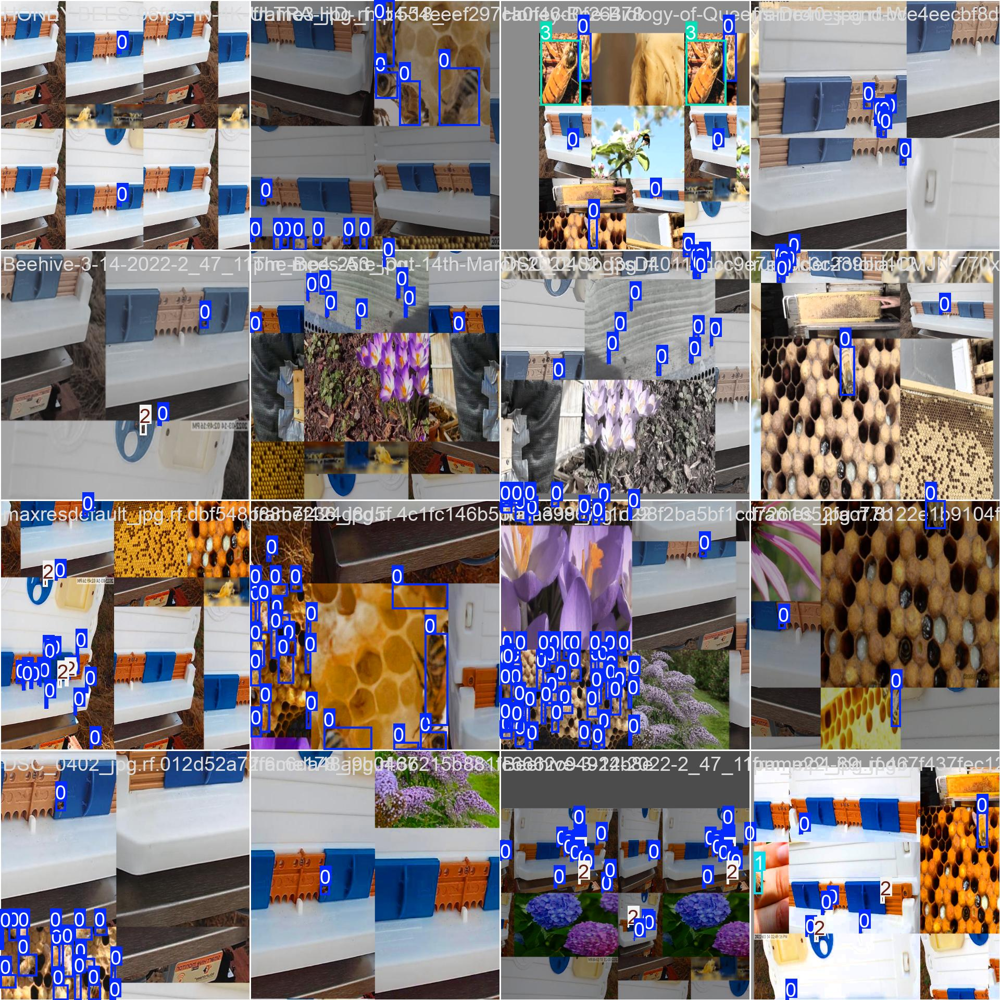

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

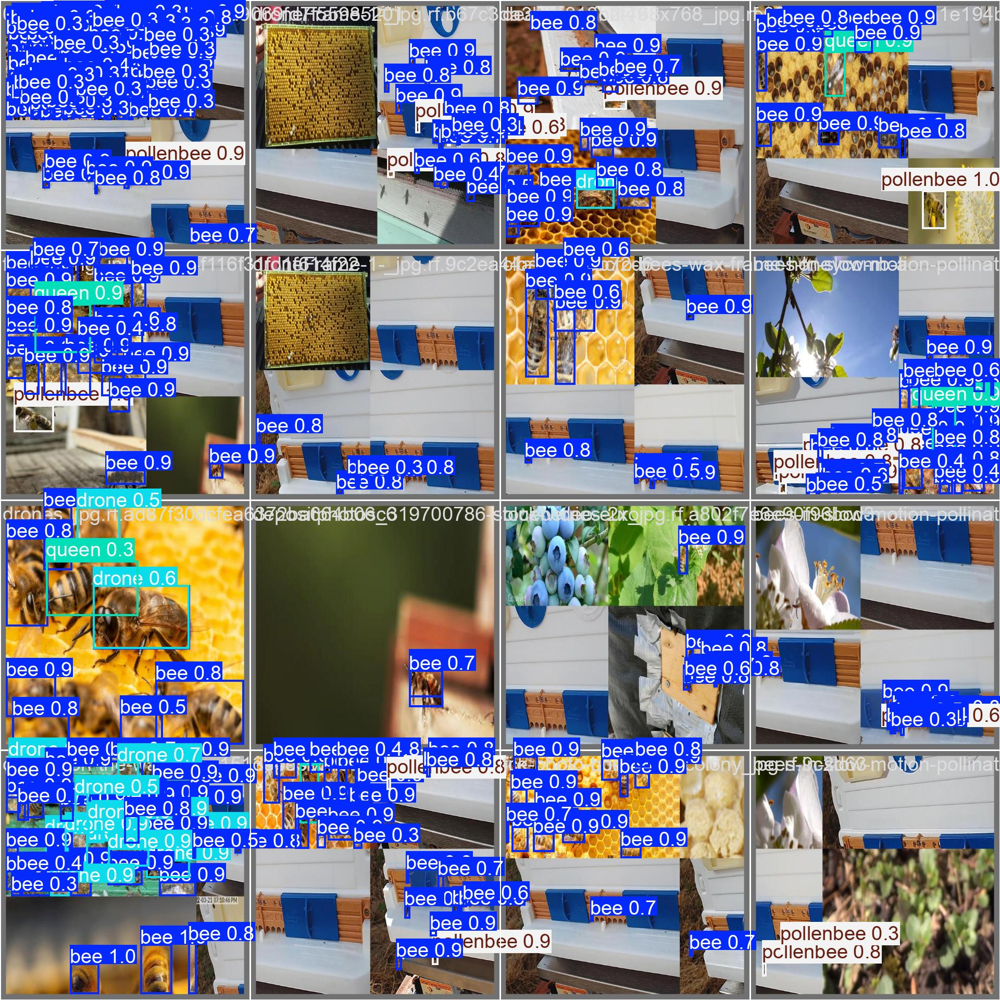

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

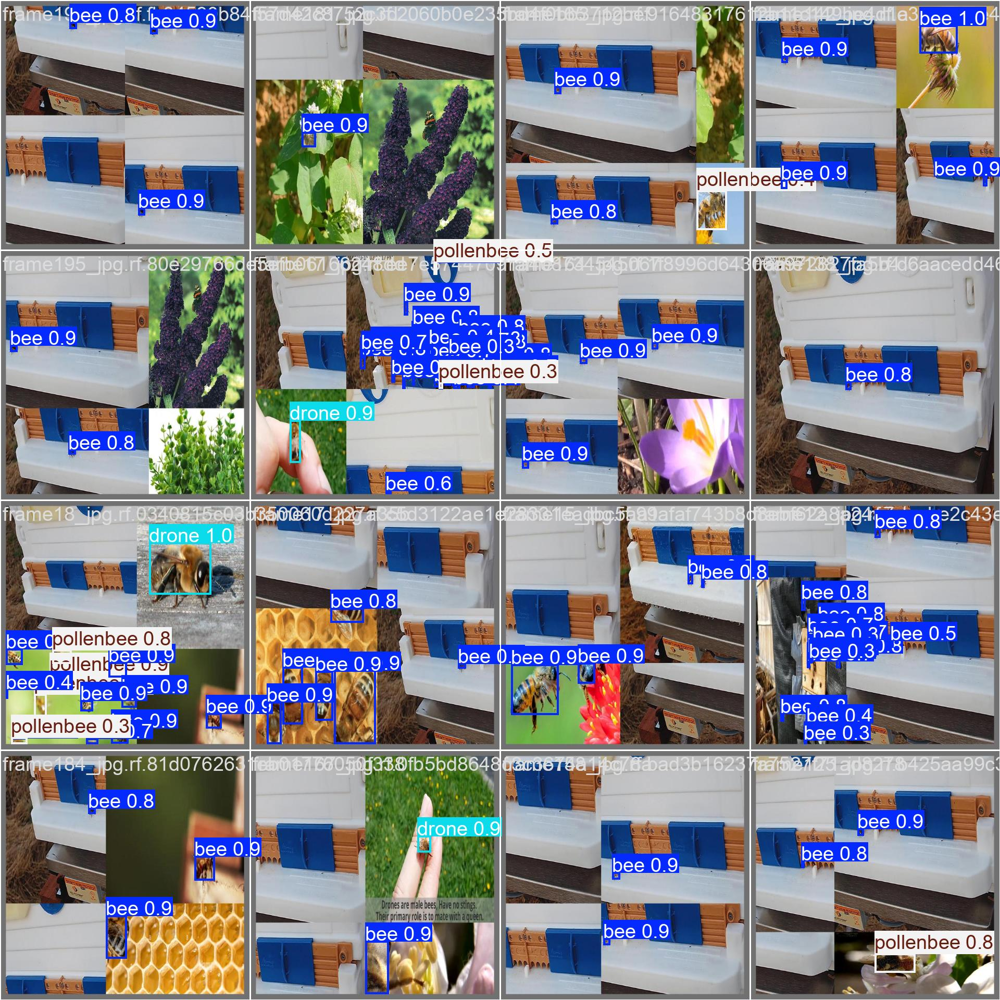

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

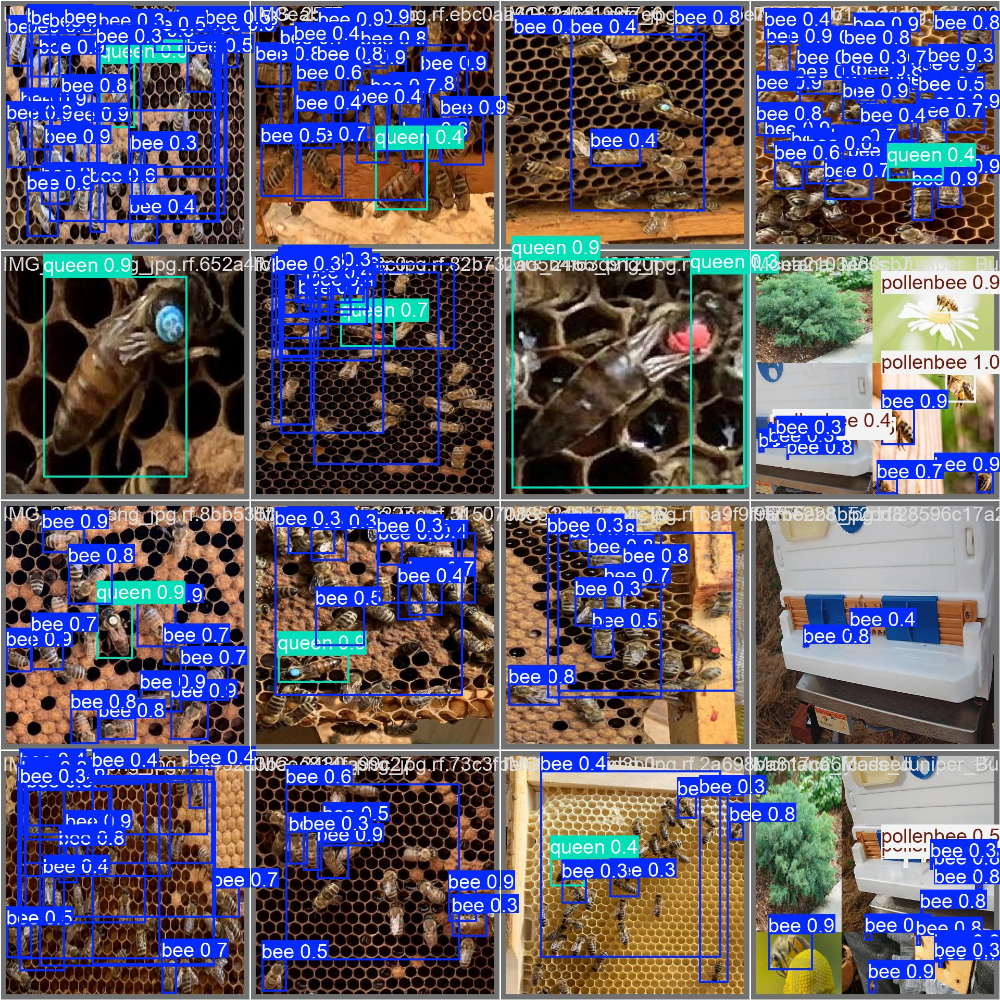

In [ ]:
Image("/content/runs/detect/train/val_batch2_pred.jpg", width=600)

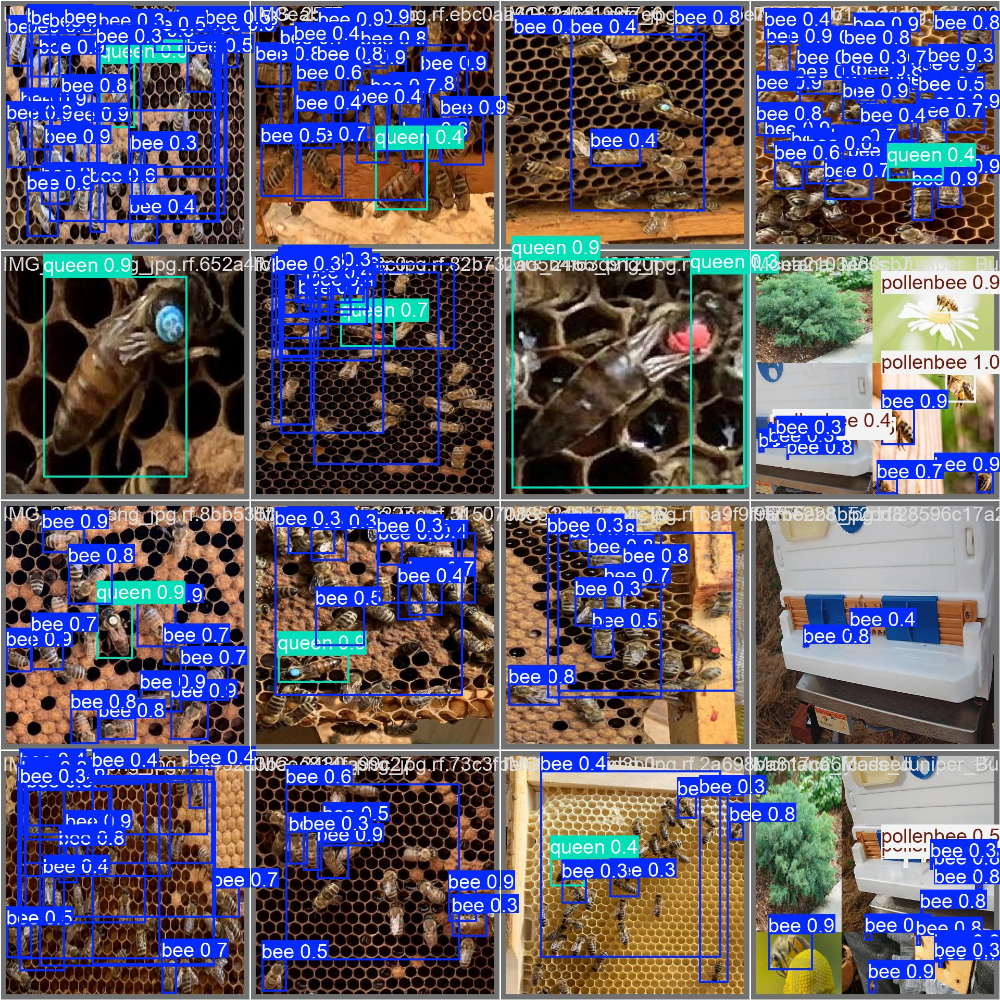

In [ ]:
Image("/content/runs/detect/train/val_batch2_pred.jpg", width=1000)


image 1/1 /content/honeybee.jpeg: 480x640 8 bees, 1 queen, 13.9ms
Speed: 2.3ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
Number of detected honeybees: 9


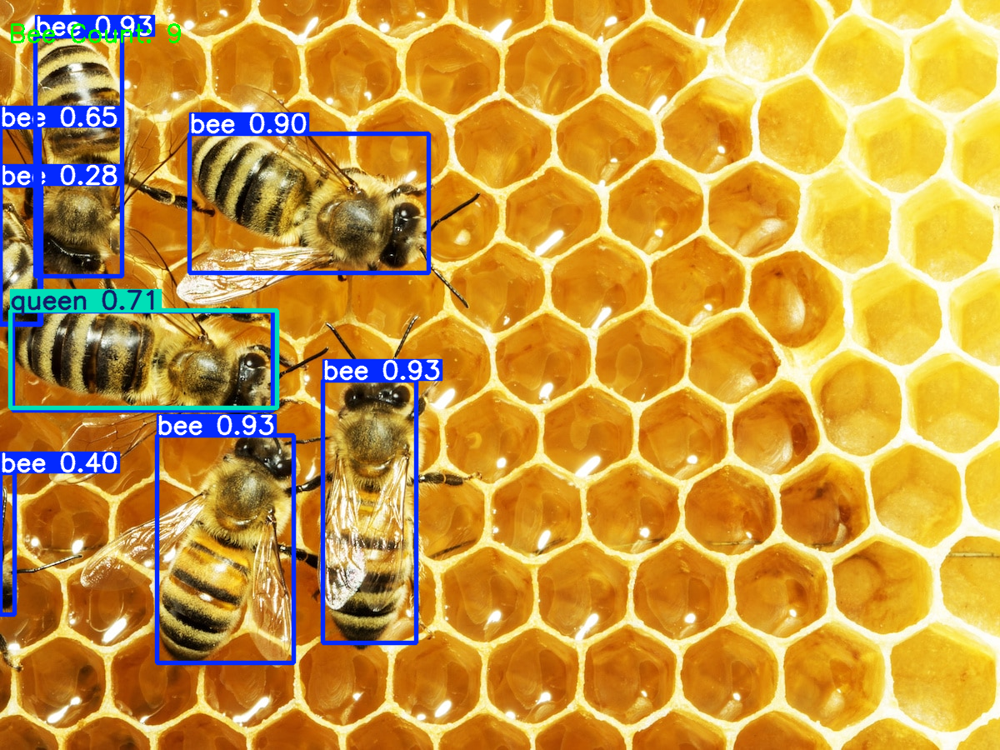

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load the model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Run inference
image_path = "/content/honeybee.jpeg"  # Replace with your image path
results = model.predict(source=image_path, conf=0.25, show=False)

# Extract detections and map all classes to "honeybee"
bee_count = 0
detections = results[0]
for box in detections.boxes:
    # Regardless of the detected class, treat it as "honeybee"
    class_id = 0  # Manually set to "honeybee" class ID
    bee_count += 1

print(f"Number of detected honeybees: {bee_count}")

# Visualize Results
annotated_image = results[0].plot()
cv2.putText(annotated_image, f"Bee Count: {bee_count}", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
cv2_imshow(annotated_image) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()


image 1/1 /content/honeybee.jpeg: 480x640 8 bees, 1 queen, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
Number of detected honeybees: 7


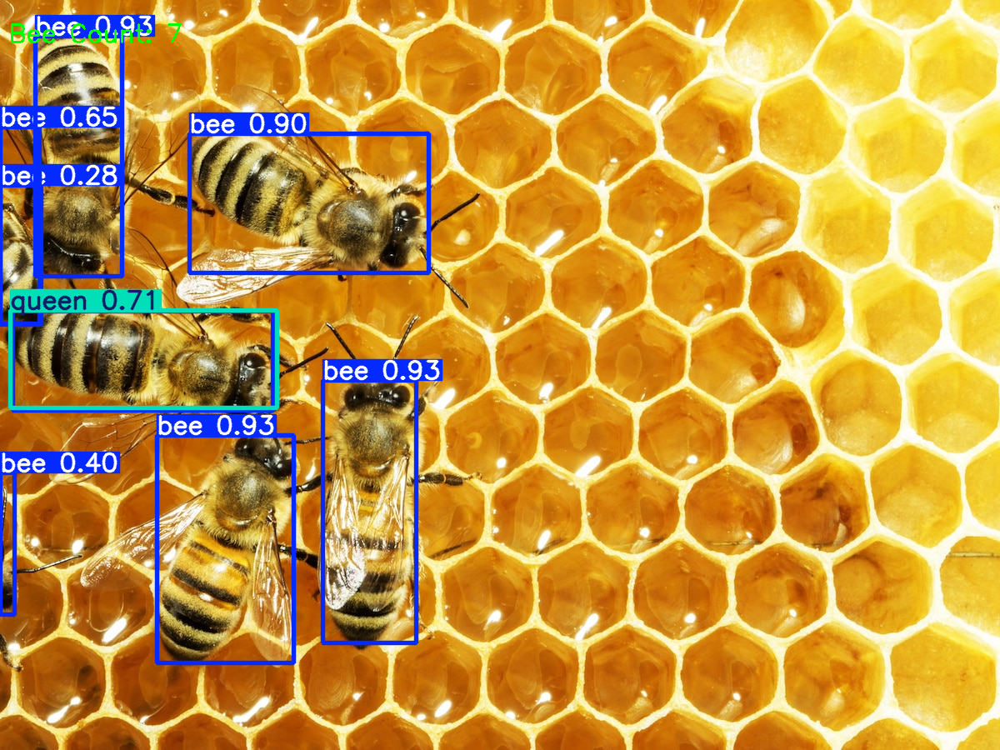

In [ ]:
# Function to calculate IoU (Intersection over Union)
def calculate_iou(box1, box2):
    # Unpack box coordinates
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    # Calculate intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    if inter_x_max <= inter_x_min or inter_y_max <= inter_y_min:
        return 0.0  # No intersection

    inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)

    # Calculate union
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area  # IoU

from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow  # Import cv2_imshow

# Load the model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Run inference
image_path = "/content/honeybee.jpeg"  # Replace with your image path
results = model.predict(source=image_path, conf=0.25, show=False)

# Extract detections and map all classes to "honeybee"
bee_count = 0
detections = results[0]
unique_boxes = []  # To store non-overlapping boxes

for box in detections.boxes:
    # Get box coordinates and class ID
    x1, y1, x2, y2 = box.xyxy[0]  # Bounding box coordinates
    class_id = int(box.cls[0])    # Get class ID

    # Check for overlaps (IoU) and count only unique detections
    is_unique = True
    for unique_box in unique_boxes:
        iou = calculate_iou((x1, y1, x2, y2), unique_box)
        if iou > 0.5:  # IoU threshold to consider overlapping boxes
            is_unique = False
            break

    if is_unique:
        unique_boxes.append((x1, y1, x2, y2))
        bee_count += 1

print(f"Number of detected honeybees: {bee_count}")

# Visualize Results
annotated_image = results[0].plot()
cv2.putText(annotated_image, f"Bee Count: {bee_count}", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
cv2_imshow(annotated_image)  # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()



image 1/1 /content/honeybee.jpeg: 480x640 8 bees, 1 queen, 14.4ms
Speed: 3.8ms preprocess, 14.4ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)
Number of detected honeybees: 7


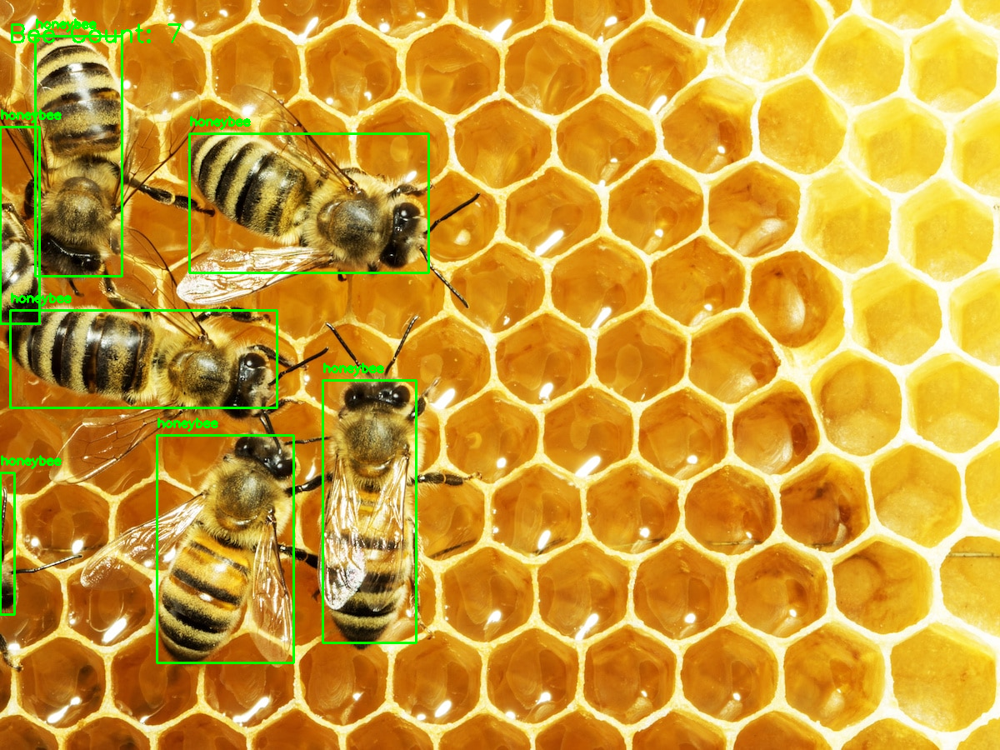

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow  # Import cv2_imshow

# Function to calculate IoU (Intersection over Union)
def calculate_iou(box1, box2):
    # Unpack box coordinates
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    # Calculate intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    if inter_x_max <= inter_x_min or inter_y_max <= inter_y_min:
        return 0.0  # No intersection

    inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)

    # Calculate union
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area  # IoU

# Load the model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Run inference
image_path = "/content/honeybee.jpeg"  # Replace with your image path
results = model.predict(source=image_path, conf=0.25, show=False)

# Extract detections and map all classes to "honeybee"
bee_count = 0
detections = results[0]
unique_boxes = []  # To store non-overlapping boxes

annotated_image = cv2.imread(image_path)  # Load the original image for custom drawing

for box in detections.boxes:
    # Get box coordinates and class ID
    x1, y1, x2, y2 = box.xyxy[0]  # Bounding box coordinates
    class_id = int(box.cls[0])    # Get class ID

    # Check for overlaps (IoU) and count only unique detections
    is_unique = True
    for unique_box in unique_boxes:
        iou = calculate_iou((x1, y1, x2, y2), unique_box)
        if iou > 0.5:  # IoU threshold to consider overlapping boxes
            is_unique = False
            break

    if is_unique:
        unique_boxes.append((x1, y1, x2, y2))
        bee_count += 1
        # Draw bounding boxes and label as "honeybee"
        cv2.rectangle(annotated_image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)  # Green box
        cv2.putText(
            annotated_image,
            "honeybee",
            (int(x1), int(y1) - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 255, 0),
            2
        )

print(f"Number of detected honeybees: {bee_count}")

# Add overall count to the image
cv2.putText(
    annotated_image,
    f"Bee Count: {bee_count}",
    (10, 50),
    cv2.FONT_HERSHEY_SIMPLEX,
    1,
    (0, 255, 0),
    2
)

# Display the annotated image
cv2_imshow(annotated_image)  # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()
